In [1]:
from pyteomics import mgf
import pandas as pd
import numpy as np
import glob as glob
import os
import matplotlib.pyplot as plt
import networkx as nx
import pingouin as pg
import seaborn as sns
sys.path.insert(0,'/global/homes/b/bpb/repos/metatlas')
from metatlas.io import feature_tools as ft

/global/common/software/m2650/msbuddy/lib/python3.8/site-packages/outdated/utils.py:14: OutdatedPackageWarning: The package pingouin is out of date. Your version is 0.4.0, the latest is 0.5.4.
Set the environment variable OUTDATED_IGNORE=1 to disable these warnings.
  return warn(


In [2]:
df = pd.read_csv('../data/public_and_internal_files_with_massive_and_redu.tsv', sep='\t')

df = df[~df['buddy'].str.contains('qc',case=False)]
df = df[~df['buddy'].str.contains('blank',case=False)]
# df['keywords'] = df['keywords'].apply(lambda x: x.split('###') if type(x)==str else [])
# df['keyword_DOM'] = df['keywords'].apply(lambda x: True if (('dom' in x) | ('organic matter' in x) | ('soil' in x)) else False)
idx1 = (df['in_massive_dom_list'])# | df['keyword_DOM']
# idx2 = (df['SampleType']=='plant')

# idx2 = df['data_dir']=='/global/cfs/cdirs/metatlas/projects/massive_data_for_scn'
idx3 = df['data_dir']=='/global/cfs/cdirs/metatlas/projects/rawdata_for_scn'
# df = df[(idx3)]# | (idx1)] #  | (idx2)
df = df[(idx3) | (idx1)] #  | (idx2)
# df = df[df['SampleType']=='plant']
file_metadata = df.copy()


out_dir = '/global/cfs/cdirs/metatlas/projects/carbon_network/raw_data'
temp_files = df['h5'].tolist()
files = []
for f in temp_files:
    base_dir = os.path.dirname(f)
    base_name = os.path.basename(f)
    new_dir = os.path.join(out_dir,base_dir)
    new_name = os.path.join(new_dir,base_name)
    files.append(new_name)
    if not os.path.isfile(new_name):
        print('File Not Found!')
        print(new_name)
        print(f)
files = pd.DataFrame(files,columns=['filename'])
print(files.shape)


(2258, 1)


In [3]:
# G = nx.read_graphml('../data/structural_clusters_network.graphml')
# G = nx.read_graphml('../data/network.graphml')
G = nx.read_graphml('/global/homes/b/bpb/repos/scndb/build/CarbonNetwork.graphml')
df = dict(G.nodes(data=True))
df = pd.DataFrame(df).T
df.index.name = 'node_id'
df.reset_index(inplace=True,drop=False)
df.head()
df.columns

Index(['node_id', 'original_index', 'massive_id', 'no_extension_basename',
       'precursor_mz', 'isolated_precursor_mz', 'rt',
       'coisolated_precursor_count', 'predicted_formula', 'estimated_fdr',
       'predicted_mass', 'mass_error', 'num_mdm_frags', 'max_score_identity',
       'best_match_method_identity', 'max_matches_identity', 'name_identity',
       'inchi_key_identity', 'smiles_identity', 'formula_identity',
       'precursor_mz_identity', 'original_p2d2_index_identity',
       'isin_fticr_formula', 'dbe', 'dbe_ai', 'dbe_ai_mod', 'ai_mod', 'ai',
       'nosc', 'h_to_c', 'o_to_c', 'n_to_c', 'p_to_c', 'c', 'h', 'o', 'n', 's',
       'p', 'class_results', 'superclass_results', 'pathway_results',
       'class_results_propagated', 'superclass_results_propagated',
       'pathway_results_propagated', 'title', 'description', 'n_to_p'],
      dtype='object')

In [12]:
idx = pd.notna(df['pathway_results_propagated'])
sum(idx) - temp.shape[0]

3049

In [11]:
temp.shape[0]

1336

In [10]:
temp = df[['h_to_c','o_to_c','pathway_results','formula_identity','predicted_formula']]
temp = temp[pd.notna(temp['predicted_formula'])]
temp = temp[pd.notna(temp['h_to_c'])]
temp = temp[pd.notna(temp['o_to_c'])]
temp.fillna('Unknown',inplace=True)
temp.shape[0] / df.shape[0]

0.9986411197173529

In [11]:
idx = temp['predicted_formula']!=temp['formula_identity']
temp[idx].shape[0]/temp.shape[0]

0.8280038100421826

Text(0, 0.5, 'H/C ratio')

<Figure size 1000x1000 with 0 Axes>

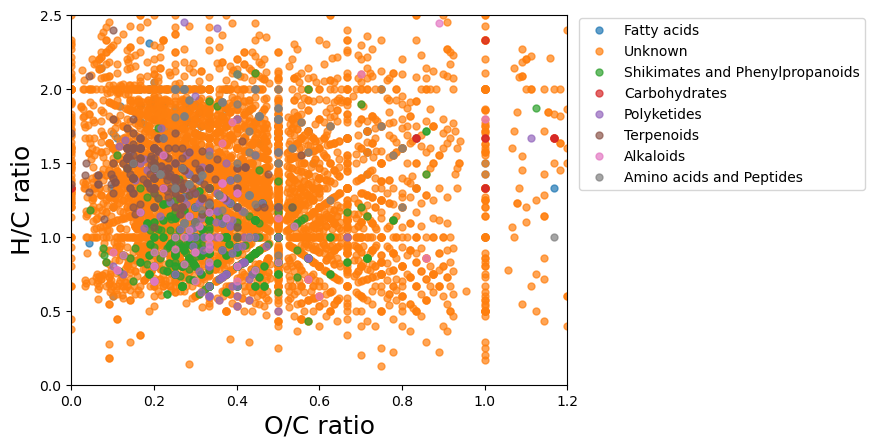

In [12]:


# Plot the dendrogram
plt.figure(figsize=(10, 10))
import matplotlib.pyplot as plt

# Define the colors for each category
# color_map = {'environment': 'red', 'plant': 'blue'}

# Map the colors to the 'origin' column
u = temp['pathway_results'].unique()

fig,ax = plt.subplots()
# Create a scatter plot of the PCA results
for uu in u:
    idx = temp['pathway_results']==uu
    ax.plot(temp.loc[idx,'o_to_c'], temp.loc[idx,'h_to_c'],'.',markersize=10,label=uu,alpha=0.7)
    
ax.set_xlim(0,1.2)
ax.set_ylim(0,2.5)
ax.legend(bbox_to_anchor=(1.01, 1.01),loc='upper left')
ax.set_xlabel('O/C ratio',fontsize=18)
ax.set_ylabel('H/C ratio',fontsize=18)


In [111]:
429/(12*150)*1000

238.33333333333334

In [4]:
sum(pd.notna(df['inchi_key_identity'])),sum(pd.notna(df['pathway_results'])),df.shape[0]

(1383, 1336, 7359)

In [13]:

ppm_tolerance = 5
mz_tol = 0.002
rt_min = 1
rt_max = 100

atlas = df[['node_id','precursor_mz']].copy()
atlas.rename(columns={'precursor_mz':'mz','node_id':'label'},inplace=True)
atlas['rt_min'] = rt_min
atlas['rt_max'] = rt_max
atlas['mz_tolerance'] = mz_tol
atlas['rt_tolerance'] = 100
atlas['ppm_tolerance'] = ppm_tolerance
atlas['extra_time'] = 0
atlas['rt_peak'] = (rt_min+rt_max)/2  
atlas['group_index'] = ft.group_consecutive(atlas['mz'].values[:],
                                    stepsize=ppm_tolerance,
                                    do_ppm=True)



In [6]:

out = []
counter = 0
# files = files.sample(150)
for f in files['filename']:
    try:
        d = ft.get_atlas_data_from_file(f,atlas,desired_key='ms1_neg')
    except:
        print('Can not read',f)
        continue
    d = d[d['in_feature']==True].groupby('label').apply(ft.calculate_ms1_summary).reset_index()
    d['filename'] = f
    out.append(d)
    counter += 1
    print(counter)
out = pd.concat(out)
out.rename(columns={'label':'node_id'},inplace=True)



1
2
3
4
5
6
7
8
9
10
11
12
13
14
15
16
17
18
19
20
21
22
23
24
25
26
27
28
29
30
31
32
33
34
35
36
37
38
39
40
41
42
43
44
45
46
47
48
49
50
51
52
53
54
55
56
57
58
59
60
61
62
63
64
65
66
67
68
69
70
71
72
73
74
75
76
77
78
79
80
81
82
83
84
85
86
87
88
89
90
91
92
93
94
95
96
97
98
99
100
101
102
103
104
105
106
107
108
109
110
111
112
113
114
115
116
117
118
119
120
121
122
123
124
125
126
127
128
129
130
131
132
133
134
135
136
137
138
139
140
141
142
143
144
145
146
147
148
149
150
151
152
153
154
155
156
157
158
159
160
161
162
163
164
165
166
167
168
169
170
171
172
173
174
175
176
177
178
179
180
181
182
183
184
185
186
187
188
189
190
191
192
193
194
195
196
197
198
199
200
201
202
203
204
205
206
207
208
209
210
211
212
213
214
215
216
217
218
219
220
221
222
223
224
225
226
227
228
229
230
231
232
233
234
235
236
237
238
239
240
241
242
243
244
245
246
247
248
249
250
251
252
253
254
255
256
257
258
259
260
261
262
263
264
265
266
267
268
269
270
271
272
273
274
275
276
277


In [7]:
# out.to_pickle('/global/cfs/cdirs/metatlas/projects/carbon_network/temp_data/all_berkeley_lab_data.pkl')
# out.to_pickle('/global/cfs/cdirs/metatlas/projects/carbon_network/temp_data/century_experiment_data.pkl')
# out.to_pickle('/global/cfs/cdirs/metatlas/projects/carbon_network/temp_data/wavestab3_data.pkl')
# out.to_pickle('/global/cfs/cdirs/metatlas/projects/carbon_network/temp_data/plantmasst_data.pkl')
out.to_pickle('/global/cfs/cdirs/metatlas/projects/carbon_network/temp_data/allCarbonData.pkl')

In [21]:
# out = pd.read_pickle('/global/cfs/cdirs/metatlas/projects/carbon_network/temp_data/all_berkeley_lab_data.pkl')
# out = pd.read_pickle('/global/cfs/cdirs/metatlas/projects/carbon_network/temp_data/wavestab3_data.pkl')
# out = pd.read_pickle('/global/cfs/cdirs/metatlas/projects/carbon_network/temp_data/century_experiment_data.pkl')
out = pd.read_pickle('/global/cfs/cdirs/metatlas/projects/carbon_network/temp_data/allCarbonData.pkl')
out_plant = pd.read_pickle('/global/cfs/cdirs/metatlas/projects/carbon_network/temp_data/plantmasst_data.pkl')


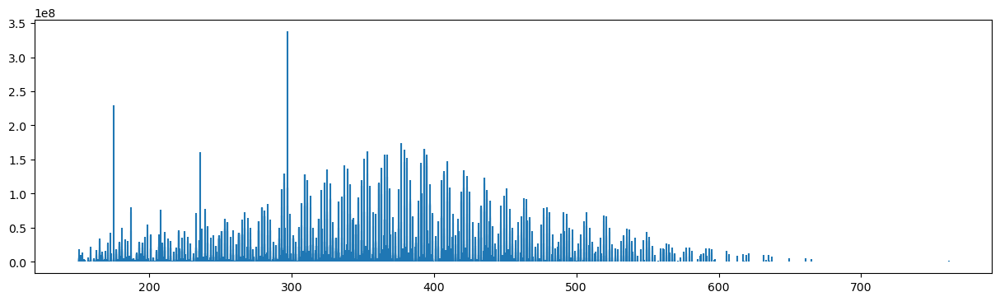

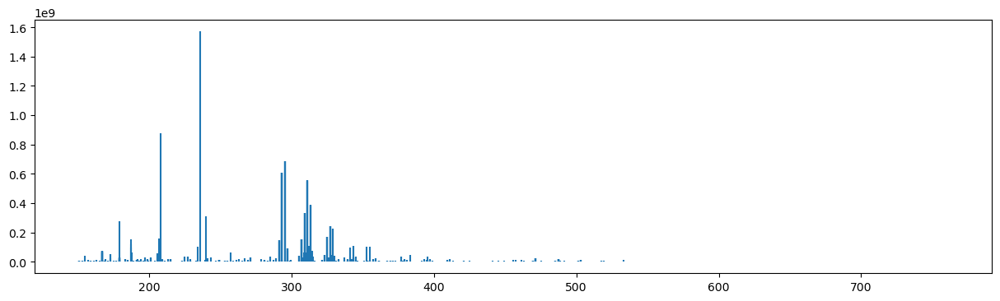

In [68]:
def make_spectrum(out):
    # y_col = 'peak_height'
    y_col = 'peak_area'
    cols = ['mz_centroid',y_col]
    # & (out['num_datapoints']>1) & (out['peak_height']<1e80) & (out['peak_height']>1)
    y = out[(out['mz_centroid']>150)].groupby('node_id')[cols].median()
    # y = y[y['peak_area']<1e9]
    y.reset_index(inplace=True,drop=True)
    fig, ax = plt.subplots(figsize=(15,4))
    ax.vlines(y['mz_centroid'],0*y[y_col],y[y_col])
    # ax.set_xlim(300.0,320)
    # ax.set_yscale('log')

make_spectrum(out)
make_spectrum(out_plant)

In [15]:
out['origin'] = 'environment'
out_plant['origin'] = 'plant'
out = pd.concat([out,out_plant])

In [16]:
origin = out[['filename','origin']].drop_duplicates()
origin

,filename,origin
0,/pscratch/sd/b/bpb/massive/v01/MSV000088543/cc...,environment
0,/pscratch/sd/b/bpb/massive/v01/MSV000088543/cc...,environment
0,/pscratch/sd/b/bpb/massive/v01/MSV000088543/cc...,environment
0,/pscratch/sd/b/bpb/massive/v01/MSV000088543/cc...,environment
0,/pscratch/sd/b/bpb/massive/v01/MSV000088543/cc...,environment
...,...,...
0,/pscratch/sd/b/bpb/massive/v01/MSV000083611/cc...,plant
0,/pscratch/sd/b/bpb/massive/v01/MSV000083611/cc...,plant
0,/pscratch/sd/b/bpb/massive/v01/MSV000083105/cc...,plant
0,/pscratch/sd/b/bpb/massive/v01/MSV000083105/cc...,plant


In [17]:
import pandas as pd
import numpy as np

def make_dataframe(out,fill_value = 0):
    min_value = 0
    # out['sampletype'] = out['filename'].apply(lambda x: os.path.basename(x))
    node_data = pd.pivot_table(out,index=['node_id'],columns=['filename'],values='peak_area',aggfunc=np.mean,fill_value=fill_value)
    # cols = node_data.columns
    # node_data['lbnl-carbon'] = node_data.mean(axis=1)
    # Select the columns containing the intensity values

    # node_data['average_intensity'] = node_data.apply(lambda row: np.mean(row.nlargest(10)), axis=1)
    # node_data.drop(columns=cols,inplace=True)
    # node_data = node_data.apply(lambda x: np.log10(x))
    # Calculate the average of the 10 most intense columns for each row
    node_data = node_data.div(node_data.max())

    return node_data

carbon_df = make_dataframe(out,fill_value=0)
# plant_df = make_dataframe(out_plant,fill_value=0)



In [ ]:
plt.figure(ncols=2,nrows=1,figsize=(10, 10))
idx = carbon_df[carbon_df['origin']=='environment']

y = carbon_df[cols]


No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.


<Figure size 1000x1000 with 0 Axes>

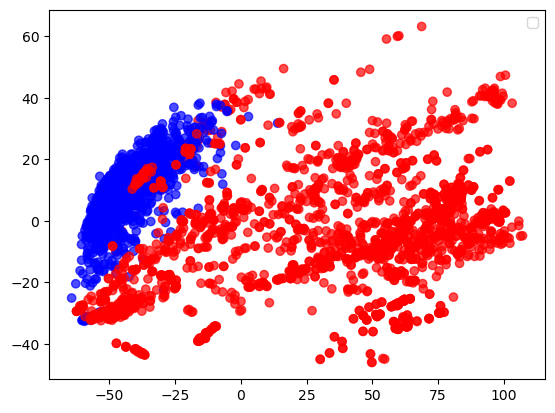

In [97]:
temp = carbon_df.T
temp = pd.merge(temp,origin,left_index=True,right_on='filename')
temp.reset_index(inplace=True,drop=True)
temp.drop(columns=['filename'],inplace=True)
cols = temp.columns
cols = list(set(cols) - set(['origin']))
v = temp[cols].values
v[v<0.0001] = 0
v = v + 0.0001
v = np.log10(v)
Z = sch.linkage(v, method='ward')

# Plot the dendrogram
plt.figure(figsize=(10, 10))
import matplotlib.pyplot as plt

# Define the colors for each category
color_map = {'environment': 'red', 'plant': 'blue'}

# Map the colors to the 'origin' column
colors = temp['origin'].map(color_map)


from sklearn.decomposition import PCA
# Perform PCA on v dataframe


pca_result = pca.fit_transform(v)


fig,ax = plt.subplots()
# Create a scatter plot of the PCA results
s = ax.scatter(pca_result[:, 0], pca_result[:, 1],c=colors,alpha=0.7)
ax.legend()

In [15]:
file_metadata.columns

Index(['no_extension', 'h5', 'buddy', 'data_dir', 'massive_id', 'h5_basename',
       'no_extension_basename', 'redu_filename', 'title', 'dataset',
       'description', 'instrument', 'keywords', 'keyword_DOM',
       'ATTRIBUTE_DatasetAccession', 'ChromatographyAndPhase',
       'YearOfAnalysis', 'SampleType', 'IonizationSourceAndPolarity',
       'SampleCollectionMethod', 'filename', 'MassSpectrometer',
       'NCBITaxonomy', 'SampleExtractionMethod', 'in_massive_dom_list',
       'num_unique_spectra', 'num_unique_formula', 'row_count', 'hash_value',
       'fraction_within_half_tolerance', 'total_formula', 'good_formula'],
      dtype='object')

In [75]:
file_metadata = pd.read_csv('../data/public_and_internal_files_with_massive_and_redu.tsv', sep='\t')
file_metadata = file_metadata[['title','massive_id','h5','description','keywords']]
file_metadata.drop_duplicates(inplace=True)
file_metadata.reset_index(inplace=True,drop=True)
file_metadata

,title,massive_id,h5,description,keywords
0,Exometabolomics of Switchgrass rhizosphere,MSV000088543,/pscratch/sd/b/bpb/massive/v01/MSV000088543/cc...,Project studies an impact of abiotic stressors...,"['switchgrass metabolites', 'soil', 'rhizosphe..."
1,Exometabolomics of Switchgrass rhizosphere,MSV000088543,/pscratch/sd/b/bpb/massive/v01/MSV000088543/cc...,Project studies an impact of abiotic stressors...,"['switchgrass metabolites', 'soil', 'rhizosphe..."
2,Exometabolomics of Switchgrass rhizosphere,MSV000088543,/pscratch/sd/b/bpb/massive/v01/MSV000088543/cc...,Project studies an impact of abiotic stressors...,"['switchgrass metabolites', 'soil', 'rhizosphe..."
3,Exometabolomics of Switchgrass rhizosphere,MSV000088543,/pscratch/sd/b/bpb/massive/v01/MSV000088543/cc...,Project studies an impact of abiotic stressors...,"['switchgrass metabolites', 'soil', 'rhizosphe..."
4,Exometabolomics of Switchgrass rhizosphere,MSV000088543,/pscratch/sd/b/bpb/massive/v01/MSV000088543/cc...,Project studies an impact of abiotic stressors...,"['switchgrass metabolites', 'soil', 'rhizosphe..."
...,...,...,...,...,...
9671,GNPS Labeled B. thetaiotaomicron sphingolipids...,MSV000087619,/pscratch/sd/b/bpb/massive/v01/MSV000087619/cc...,Palmitic acid alkyne labeled Bacteroides theta...,"['Metabolomics', 'Microbiome']"
9672,GNPS - Serotonin biosynthesis and metabolism i...,MSV000088750,/pscratch/sd/b/bpb/massive/v01/MSV000088750/cc...,"Representative MS data of tph-1, pah-1, pah-1;...","['metabolomics', 'C. elegans', 'serotonin', 't..."
9673,GNPS Comparative metabolomics of diverse fungi...,MSV000089206,/pscratch/sd/b/bpb/massive/v01/MSV000089206/cc...,Comparative metabolomics of crmA mutants for A...,"['crmA', 'aspergillus fumigatus', 'Penicillium..."
9674,NaN,CenturyExpPilot_20230414,/global/cfs/cdirs/metatlas/projects/rawdata_fo...,NaN,[]


In [78]:
cols = carbon_df.index.tolist()
g = pd.merge(carbon_df.T,file_metadata,left_index=True,right_on='h5',how='inner')[cols + ['massive_id']].groupby('massive_id').apply(lambda x: x.mean())
g = g > 0.01
g = g.sum(axis=1)
g = g.to_frame()
g.columns = ['num_nodes']
cols = ['title','massive_id','description','keywords']
g = pd.merge(g,file_metadata[cols],left_index=True,right_on='massive_id',how='inner').drop_duplicates().sort_values('num_nodes',ascending=False)
g.reset_index(inplace=True,drop=True)
# g.to_csv('node_count_per_experiment.csv',index=False)
g


,num_nodes,title,massive_id,description,keywords
0,3978,,CenturyExpPilot_20230414,,[]
1,3364,,SoilExTestDirSolv_20230414-rerun,,[]
2,3355,GNPS DOM Interlab-LCMS 2021 - lab22,MSV000088187,Interlab study of marine dissolved organic mat...,"['interlab study', 'DOM']"
3,3122,"GNPS DOM LCMS-Interlab Study 2021 Lab5, version 2",MSV000087588,LCMS Interlab study of marine dissolved organi...,"['marine dissolved organic matter, Synechococc..."
4,3099,GNPS DOM Inter-Lab LC-MS/MS study - SIO DOM sa...,MSV000086993,Surface DOM sample from SIO Pier samples on Fe...,"['DOM', 'LC-MS/MS', 'Inter-Lab comparison']"
5,3037,GNPS - Neckar and Spree River Water DOM,MSV000092487,Non-target metabolomics of River DOM samples i...,"['Water', 'River']"
6,3011,GNPS - Non-targeted Metabolomics of Coastal Di...,MSV000092604,Non-targeted LC-MS/MS analysis of PPL solid ph...,"['DOM', 'LC-MS/MS', 'Marine', 'Coastal', 'Tara..."
7,2946,GNPS DOM interlab - LCMS 2021 - lab 16,MSV000087702,Interlab study of marine dissolved organic mat...,"['DOM', 'interlab']"
8,2777,2D-LC-MS/MS based non-targeted metabolomics of...,MSV000092520,Samples of marine DOM from the Ellen Browning ...,"['Marine DOM', 'untargeted', 'Metabolomics']"
9,2762,GNPS DOM Interlab Ring Trial LCMS - Lab 26,MSV000087935,DOM Interlab LCMS Samples from Lab 26. Infus...,"['LCMS', 'DOM', 'Algal', 'Interlab']"


In [79]:
cols = carbon_df.index.tolist()
file_metadata.fillna('',inplace=True)
g = pd.merge(carbon_df.T,file_metadata,left_index=True,right_on='h5',how='inner')[cols + ['massive_id','title']].groupby(['massive_id','title']).apply(lambda x: x.mean())
g.shape

(59, 7359)

In [81]:
g

,,0.0,1.0,10.0,100.0,10001.0,10002.0,10004.0,10008.0,1001.0,10012.0,...,9982.0,9983.0,9986.0,999.0,9990.0,9991.0,9992.0,9993.0,9994.0,9996.0
massive_id,title,,,,,,,,,,,,,,,,,,,,,
CenturyExpPilot_20230414,,0.005646,0.076855,0.039668,7.233280e-04,0.103856,0.007295,5.450319e-04,0.056487,1.504138e-02,5.266026e-02,...,0.005678,0.103916,0.000000e+00,0.076855,0.000000e+00,0.006567,4.922228e-03,6.333538e-04,0.021820,3.931312e-02
DAC-FA2_20230206,,0.000121,0.003268,0.005267,1.554971e-06,0.001452,0.000202,2.250152e-05,0.001615,2.425442e-04,2.072367e-05,...,0.000251,0.002764,1.878620e-07,0.003268,0.000000e+00,0.000133,4.991243e-05,4.261888e-06,0.000550,1.250657e-03
DOM-TargetedMS2_pilot1,,0.000017,0.000000,0.000000,0.000000e+00,0.013812,0.001120,1.569971e-04,0.015558,6.086858e-04,1.889270e-03,...,0.000375,0.019015,0.000000e+00,0.000000,0.000000e+00,0.000285,2.132741e-04,8.012378e-04,0.002527,7.470821e-03
FRCgw2_20230830,,0.008452,0.001271,0.075410,2.198068e-04,0.003938,0.000241,1.371778e-06,0.001402,2.077586e-04,4.689261e-04,...,0.000096,0.002995,1.207270e-06,0.001271,7.622411e-06,0.000164,4.421981e-05,0.000000e+00,0.000621,1.339530e-04
FRCgwater_20230105,,0.001252,0.022822,0.065096,6.612389e-02,0.015291,0.000868,1.670219e-04,0.024679,8.802835e-04,1.206709e-03,...,0.000178,0.026400,7.367744e-05,0.022780,0.000000e+00,0.001618,1.879012e-04,3.840001e-04,0.001113,8.586791e-03
Frtlzr_SoilSD,,0.000517,0.019009,0.045278,1.677002e-04,0.008163,0.000176,2.938337e-06,0.003569,3.979672e-05,5.874634e-04,...,0.000026,0.002639,1.014950e-05,0.019008,1.511704e-06,0.000049,3.298683e-06,1.005176e-04,0.001795,3.447746e-04
GEODES_All3,,0.000958,0.020215,0.031450,1.585786e-03,0.021387,0.005386,4.297688e-05,0.019094,2.881682e-04,4.119844e-03,...,0.000810,0.017049,1.789056e-05,0.020215,1.439226e-04,0.000129,3.778022e-05,1.321362e-05,0.012354,8.283564e-03
HumicAcid_20221110,,0.000079,0.004445,0.012584,5.407647e-04,0.000001,0.000001,1.979628e-05,0.000004,1.028069e-04,8.476852e-06,...,0.000003,0.000002,4.932634e-06,0.004444,0.000000e+00,0.000061,0.000000e+00,6.856472e-07,0.000000,1.419985e-04
MSV000083105,GNPS - Massive_Cotton_neg_YEE_JEN2_gutcontent_faeces,0.002655,0.012122,0.009904,8.718450e-02,0.000002,0.000358,1.199336e-05,0.000214,4.043503e-05,1.682971e-05,...,0.000023,0.000007,4.767561e-05,0.009566,5.429101e-06,0.000003,2.011301e-06,0.000000e+00,0.002486,2.237688e-05


(59, 7359)


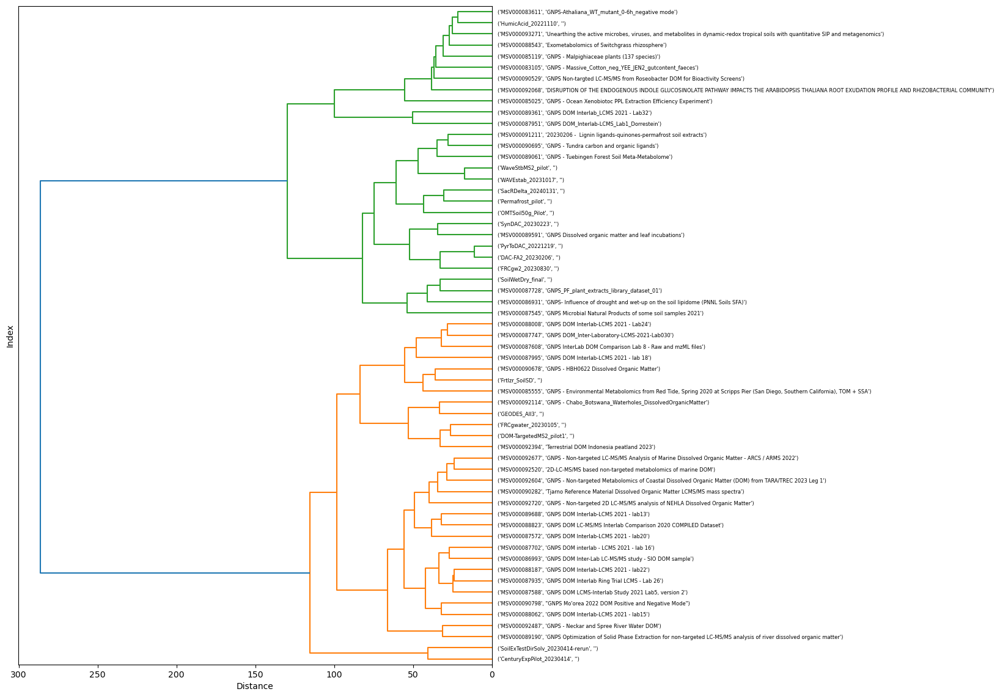

In [98]:
cols = carbon_df.index.tolist()
file_metadata.fillna('',inplace=True)
g = pd.merge(carbon_df.T,file_metadata,left_index=True,right_on='h5',how='inner')[cols + ['massive_id','title']].groupby(['massive_id','title']).apply(lambda x: x.mean())
g[g<0.0001] = 0
g = g + 0.001
g = np.log10(g)
print(g.shape)
import scipy.cluster.hierarchy as sch
import matplotlib.pyplot as plt

# Compute the linkage matrix
Z = sch.linkage(g.values, method='ward')

# Plot the dendrogram
plt.figure(figsize=(10, 14))
sch.dendrogram(Z, orientation='left', labels=g.index)

# Set plot title and labels
# plt.title('Vertical Dendrogram')
plt.xlabel('Distance')
plt.ylabel('Index')

# Show the plot
plt.show()


[t-SNE] Computing 54 nearest neighbors...
[t-SNE] Indexed 55 samples in 0.000s...
[t-SNE] Computed neighbors for 55 samples in 0.466s...
[t-SNE] Computed conditional probabilities for sample 55 / 55
[t-SNE] Mean sigma: 3.537960
[t-SNE] KL divergence after 250 iterations with early exaggeration: 43.278263
[t-SNE] KL divergence after 300 iterations: 0.015587


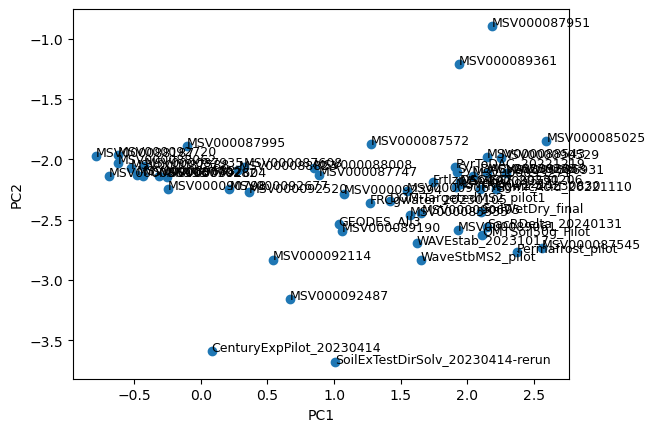

In [66]:
import pandas as pd
import matplotlib.pyplot as plt
from sklearn.decomposition import PCA
from sklearn.decomposition import PCA
from adjustText import adjust_text
from sklearn.manifold import TSNE

import matplotlib.pyplot as plt
# Perform PCA on the carbon_df dataframe


# pca = PCA(n_components=2)
cols = carbon_df.index.tolist()
file_metadata.fillna('',inplace=True)
g = pd.merge(carbon_df.T,file_metadata,left_index=True,right_on='h5',how='inner')[cols + ['massive_id','title']].groupby(['massive_id','title']).apply(lambda x: x.mean())


# pca_result = pca.fit_transform(g)

tsne = TSNE(n_components=2, verbose=1, perplexity=40, n_iter=300)
pca_result = tsne.fit_transform(g)

fig,ax = plt.subplots()
# Create a scatter plot of the PCA results
ax.scatter(pca_result[:, 0], pca_result[:, 1])
ax.set_xlabel('PC1')
ax.set_ylabel('PC2')

# Create a list to hold the text objects
texts = []
for i, txt in enumerate(g.index.get_level_values(0)):
    texts.append(ax.text(pca_result[i, 0], pca_result[i, 1], txt, fontsize=9))
plt.show()


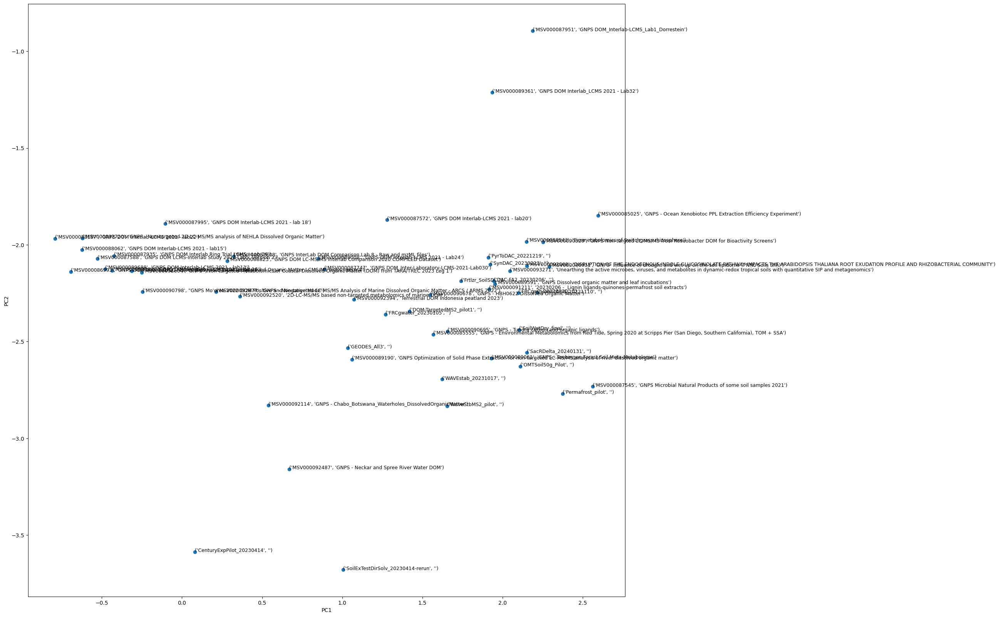

In [69]:

fig,ax = plt.subplots(figsize=(20,20))
# Create a scatter plot of the PCA results
ax.scatter(pca_result[:, 0], pca_result[:, 1])
ax.set_xlabel('PC1')
ax.set_ylabel('PC2')

# Create a list to hold the text objects
texts = []
a1 = g.index.get_level_values(0)
a2 = g.index.get_level_values(1)
for i, txt in enumerate(zip(a1,a2)):
    texts.append(ax.text(pca_result[i, 0], pca_result[i, 1], txt, fontsize=9))
plt.show()


/global/common/software/m2650/msbuddy/lib/python3.8/site-packages/seaborn/matrix.py:560: UserWarning: Clustering large matrix with scipy. Installing `fastcluster` may give better performance.
  warnings.warn(msg)
/global/common/software/m2650/msbuddy/lib/python3.8/site-packages/seaborn/matrix.py:560: UserWarning: Clustering large matrix with scipy. Installing `fastcluster` may give better performance.
  warnings.warn(msg)
/global/common/software/m2650/msbuddy/lib/python3.8/site-packages/seaborn/matrix.py:1113: UserWarning: Tight layout not applied. The bottom and top margins cannot be made large enough to accommodate all axes decorations.
  self._figure.tight_layout(**tight_params)


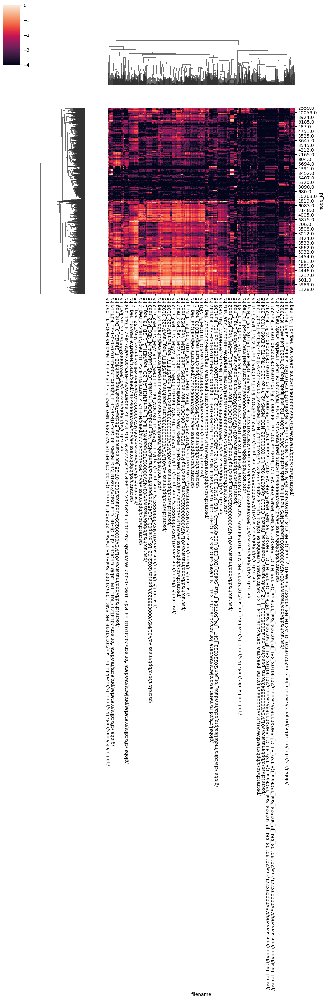

In [13]:
import seaborn as sns
import matplotlib.pyplot as plt

# Create the clustermap
carbon_df = carbon_df + 0.0001
clustermap = sns.clustermap(carbon_df.apply(np.log10))

# Display the clustermap
plt.show()


In [ ]:
carbon_df.max(axis=1)

In [37]:
nodes = [3061,2093,7579]
nodes = ['%.1f'%n for n in nodes]
carbon_df['sum'] = carbon_df.max(axis=1)
carbon_df.loc[carbon_df.index.isin(nodes),'sum']

node_id
2093.0    0.055653
3061.0    1.025721
7579.0    0.017054
Name: sum, dtype: float64

In [9]:
node_count = (carbon_df>0.01).sum(axis=1)
node_count = node_count.to_frame()
node_count.columns = ['node_count']

backup_G = G.copy()
nx.set_node_attributes(backup_G, node_count.to_dict('index'))
nx.write_graphml(backup_G,'../data/carbon_networkwith-CarbonSample-node-count.graphml')

In [51]:
# min_value = 3000
# out['sampletype'] = 'plantmasst'
# node_data = pd.pivot_table(out,index=['node_id'],columns=['sampletype'],values='peak_area',aggfunc=np.mean,fill_value=min_value)
# node_data = node_data.apply(lambda x: np.log10(x))

# # node_data.columns = ['Quant: %s'%c for c in node_data.columns]
# # node_data = node_data[cols]
# # # Select the columns to normalize
# # columns_to_normalize = node_data.columns

# # # Normalize the selected columns
# # node_data[columns_to_normalize] = normalize(node_data[columns_to_normalize], norm='l2', axis=1)

backup_G = G.copy()
nx.set_node_attributes(backup_G, node_data.to_dict('index'))
nx.write_graphml(backup_G,'../data/carbon_networkwith-plantmasst.graphml')
backup_G_mst = nx.maximum_spanning_tree(backup_G)
nx.write_graphml(backup_G_mst,'../data/carbon_networkwith-plantmasst-mst.graphml')

In [24]:
original_index = nx.get_node_attributes(G, 'original_index')
np_classifier_pathway = nx.get_node_attributes(G, 'pathway_results')
np_classifier_class = nx.get_node_attributes(G, 'class_results')
smiles_identity = nx.get_node_attributes(G, 'smiles_identity')
# structural_cluster_subclassname  = nx.get_node_attributes(G, 'structural_cluster_subclassname')
# structural_cluster_subclassname

In [25]:
# node_data = pd.pivot_table(out,index=['node_id'],columns=['experiment'],values='peak_area',aggfunc=np.mean,fill_value=300)
# node_data = pd.pivot_table(out,index=['node_id'],columns=['sampletype'],values='peak_area',aggfunc=np.mean,fill_value=300)
# node_data = pd.pivot_table(out[out['sampletype'].str.contains('Hi')],index=['node_id'],columns=['experiment','sampletype'],values='peak_area',aggfunc=np.mean,fill_value=300)
# node_data.columns = ['%s-%s'%(c[1],c[0]) for c in node_data.columns]

# node_data = node_data.apply(lambda  x: np.log10(x+1),axis=1)
# s = node_data.sum(axis=0).values
# m = s.mean()
# node_data.values[:,:] = m * (node_data.values[:,:]/s)
# node_data.columns = [c.split('/')[-1].split('_')[12] for c in node_data.columns]

# node_data.to_csv('../data/log10_averages_treatments.csv')
node_data.columns = ['Quant: %s'%c for c in node_data.columns]

n = node_data.copy()
m = n.min(axis=1)
m = n.values - m.values[:,None]
n = pd.DataFrame(m,index=n.index,columns=n.columns)

m = n.max(axis=1)
m = n.values / m.values[:,None]
n = pd.DataFrame(m,index=n.index,columns=n.columns)


original_index = nx.get_node_attributes(G, 'original_index')
np_classifier_pathway = nx.get_node_attributes(G, 'pathway_results')
np_classifier_class = nx.get_node_attributes(G, 'class_results')
smiles_identity = nx.get_node_attributes(G, 'smiles_identity')
# temp = {}
# for c in n.columns:
    # temp[c] = nx.get_node_attributes(backup_G, c)

temp = pd.merge(n,pd.DataFrame({'np_classifier_pathway':np_classifier_pathway}),left_index=True,right_index=True)
temp = pd.merge(temp,pd.DataFrame({'np_classifier_class':np_classifier_class}),left_index=True,right_index=True)
temp = pd.merge(temp,pd.DataFrame({'smiles_identity':smiles_identity}),left_index=True,right_index=True)
cols = [c for c in temp.columns if 'Quant' in c]

# cluster_df = temp.groupby(['np_classifier_pathway'])[cols].mean()
cluster_df = temp.groupby(['np_classifier_class','np_classifier_pathway'])[cols].mean()
identity_df = temp.groupby(['np_classifier_pathway','np_classifier_class','smiles_identity'])[cols].mean()
cluster_df

Quant: VGF138_G04_neg.h5  \
np_classifier_class                 np_classifier_pathway                                       
12-oxophytodienoic acid metabolites Fatty acids                                      0.784235   
2-pyrone derivatives                Polyketides                                      0.539255   
                                    Terpenoids                                       0.395156   
3-Decalinoyltetramic acids          Polyketides                                      0.270596   
3-Spirotetramic acids               Polyketides                                      0.852248   
...                                                                                       ...   
Valerenane sesquiterpenoids         Terpenoids                                       0.775176   
Wax monoesters                      Fatty acids                                      0.286064   
Zearalenones                        Polyketides                                      0.671842   
p-Terphenyls                        Shikimates and Phenylpropanoids                  0.058572   
pteridine alkaloids                 Alkaloids                                        0.390189   

                                                                     Quant: VGF139_A11_neg.h5  \
np_classifier_class                 np_classifier_pathway                                       
12-oxophytodienoic acid metabolites Fatty acids                                      0.568534   
2-pyrone derivatives                Polyketides                                      0.445411   
                                    Terpenoids                                       0.605750   
3-Decalinoyltetramic acids          Polyketides                                      0.000000   
3-Spirotetramic acids               Polyketides                                      0.745545   
...                                                                                       ...   
Valerenane sesquiterpenoids         Terpenoids                                       0.647367   
Wax monoesters                      Fatty acids                                      0.491183   
Zearalenones                        Polyketides                                      0.535642   
p-Terphenyls                        Shikimates and Phenylpropanoids                  0.210292   
pteridine alkaloids                 Alkaloids                                        0.428871   

                                                                     Quant: VGF139_D06_neg.h5  \
np_classifier_class                 np_classifier_pathway                                       
12-oxophytodienoic acid metabolites Fatty acids                                      0.371031   
2-pyrone derivatives                Polyketides                                      0.528559   
                                    Terpenoids                                       0.848234   
3-Decalinoyltetramic acids          Polyketides                                      0.000000   
3-Spirotetramic acids               Polyketides                                      0.643301   
...                                                                                       ...   
Valerenane sesquiterpenoids         Terpenoids                                       0.515596   
Wax monoesters                      Fatty acids                                      0.420048   
Zearalenones                        Polyketides                                      0.430087   
p-Terphenyls                        Shikimates and Phenylpropanoids                  0.271965   
pteridine alkaloids                 Alkaloids                                        0.406644   

                                                                     Quant: VGF139_D07_neg.h5  \
np_classifier_class                 np_classifier_pathway                                       
12-oxophytodienoic acid metabolites Fatty acids                                      0.25

In [26]:
temp.sort_values('np_classifier_pathway').head(40)

,Quant: VGF138_G04_neg.h5,Quant: VGF139_A11_neg.h5,Quant: VGF139_D06_neg.h5,Quant: VGF139_D07_neg.h5,Quant: VGF140_A06_neg.h5,Quant: VGF140_C04_neg.h5,Quant: VGF141_E07_neg.h5,Quant: VGF141_F11_neg.h5,Quant: VGF143_A07_neg.h5,Quant: VGF144_C09_neg.h5,...,Quant: VGF151_F11_neg.h5,Quant: VGF151_H02_neg.h5,Quant: VGF154_F02_neg.h5,Quant: VGF154_G04_neg.h5,Quant: VGF155_D11_neg.h5,Quant: VGF156_B09_neg.h5,Quant: VGF158_G02_neg.h5,np_classifier_pathway,np_classifier_class,smiles_identity
450.0,0.518506,0.315552,0.475619,0.569101,0.797181,1.000000,0.828547,0.810589,0.576128,0.637407,...,0.112454,0.507521,0.958075,0.732370,0.520389,0.895448,0.112454,Alkaloids,Quinoline alkaloids,Cc1nc2ccccc2c(C(=O)O)c1O
1216.0,0.580449,0.656485,0.861442,0.814905,0.954615,0.767800,1.000000,0.966753,0.828213,0.945795,...,0.000000,0.626371,0.998584,0.915577,0.699736,0.841558,0.533181,Alkaloids,Pyridine alkaloids,O=C(O)c1ccc2ccccc2n1
505.0,0.263392,0.000000,0.703514,0.039837,0.907517,0.916047,0.709777,0.776942,0.495441,0.450829,...,0.405914,0.543041,0.560624,0.734920,0.518495,1.000000,0.611811,Alkaloids,Pyridine alkaloids,COc1cccnc1C(=O)O
53.0,0.000000,0.000000,0.122605,0.330106,0.272232,0.318985,0.446916,0.444793,0.360282,0.538728,...,0.000000,0.310056,0.925138,1.000000,0.544348,0.677569,0.385482,Alkaloids,Pyridine alkaloids,O=C(O)c1ccccn1
1171.0,0.257383,0.336491,0.653180,0.377640,0.696653,0.603971,0.779790,1.000000,0.490867,0.834663,...,0.194962,0.111352,0.579403,0.601522,0.630754,0.567057,0.232584,Alkaloids,Phenylethylamines,COc1cc(CC(N)C(=O)O)ccc1O
1170.0,0.332578,0.000000,0.000000,0.000000,0.837013,1.000000,0.206608,0.989491,0.360967,0.034288,...,0.000000,0.934746,0.536646,0.576487,0.154131,0.630891,0.000000,Alkaloids,Quinoline alkaloids,NC(=O)c1ccc2cccc(O)c2n1
59.0,0.000000,0.000000,0.344320,0.725540,0.000000,0.000000,0.212692,0.422171,0.169711,0.535288,...,0.295440,0.000000,1.000000,0.701490,0.673720,0.116748,0.000000,Alkaloids,Simple indole alkaloids,Oc1cccc2[nH]ccc12
1253.0,0.000000,0.038217,0.527415,0.000000,0.302873,0.317469,0.744292,0.387464,0.396873,0.000000,...,0.694657,0.138884,0.282852,0.295617,0.691729,0.688477,0.153339,Alkaloids,Pyridine alkaloids,NC(=O)c1ccc(-c2nc(-c3ccccn3)c(-c3ccc4c(c3)OCO4...
116.0,0.263293,0.000000,0.703250,0.039823,0.907176,0.915703,0.709511,0.776650,0.495255,0.450659,...,0.405761,0.542837,0.560413,0.734644,0.518301,1.000000,0.611581,Alkaloids,Pyridine alkaloids,Cc1cc(=O)c(C(=O)O)c[nH]1
717.0,0.756099,0.447534,0.710870,0.000000,0.860813,0.669754,0.527987,1.000000,0.794759,0.682055,...,0.139929,0.546480,0.620981,0.696488,0.362722,0.590668,0.016936,Alkaloids,Quinoline alkaloids,Cn1c(=O)cc(O)c2ccccc21


,,Quant: CMT,Quant: GRASS,Quant: OMT,Quant: RWC,Quant: UNBDP
np_classifier_class,np_classifier_pathway,,,,,
Irregular monoterpenoids,Terpenoids,1.000000,0.429183,0.000000,0.160146,0.130447
Phenylalanine-derived alkaloids,Alkaloids,1.000000,0.018104,0.000000,0.081065,0.326430
Estrane steroids,Terpenoids,0.957994,0.167382,0.063916,0.564826,0.332726
Paraconic acids and derivatives,Fatty acids,0.728485,0.246221,0.371959,0.508484,0.220506
Heterocyclic fatty acids,Fatty acids,1.000000,0.000000,0.387783,0.342752,0.606688
...,...,...,...,...,...,...
Naphthoquinones,Polyketides,0.267854,0.332539,0.485901,0.666667,0.505591
p-Terphenyls,Shikimates and Phenylpropanoids,0.326003,0.313747,0.373504,0.666667,0.613746
Epoxyeicosatrienoic acids,Fatty acids,0.044441,1.000000,0.000000,0.546148,0.152703


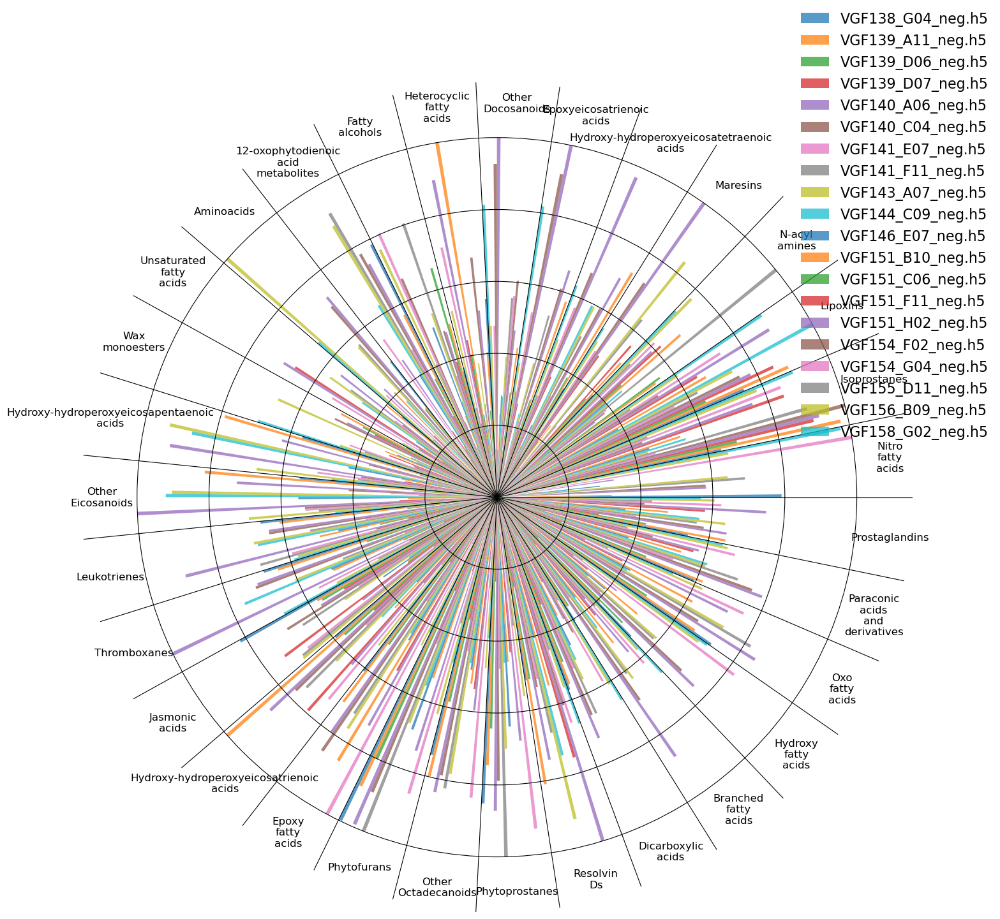

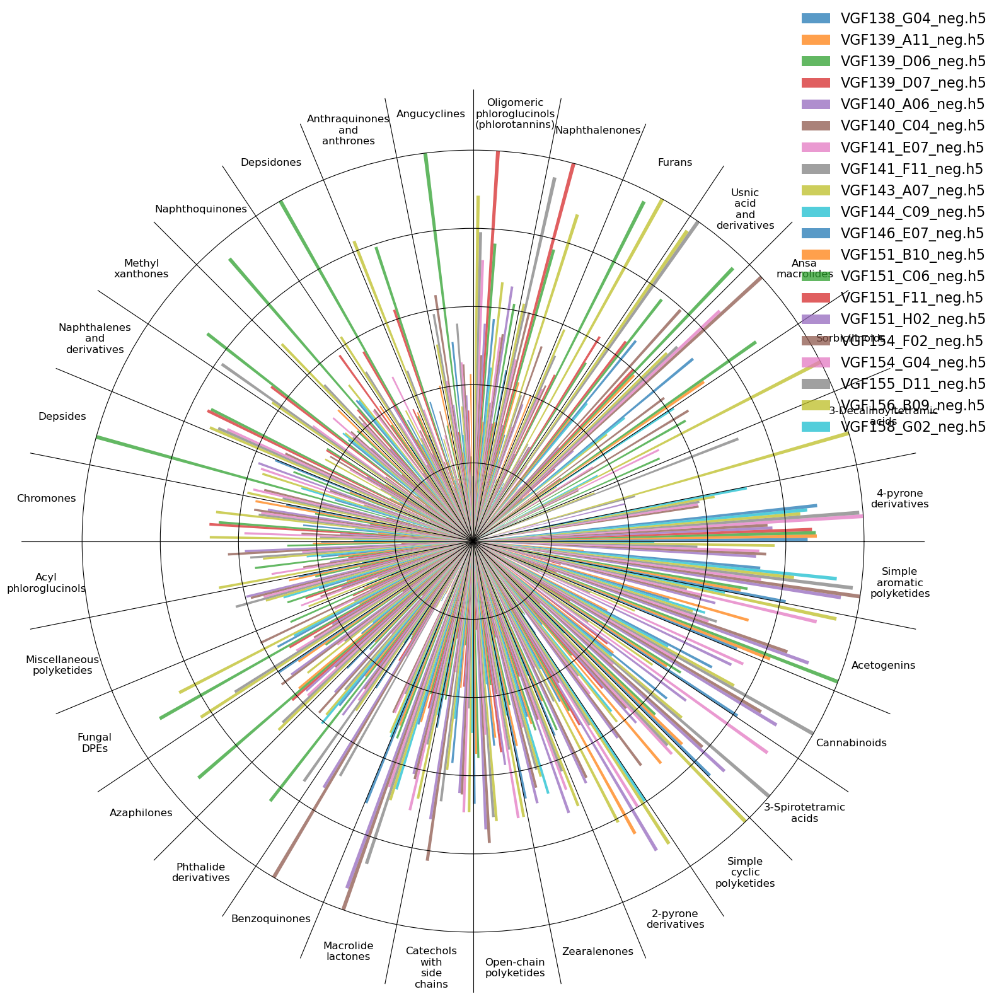

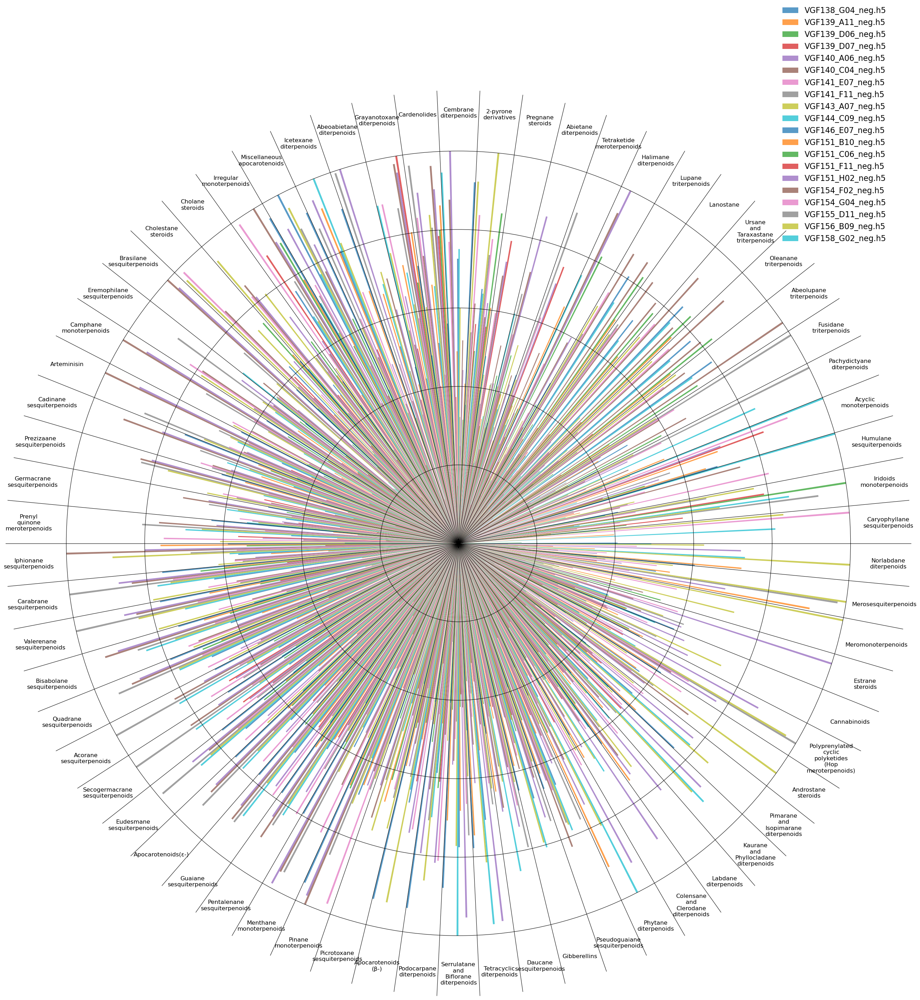

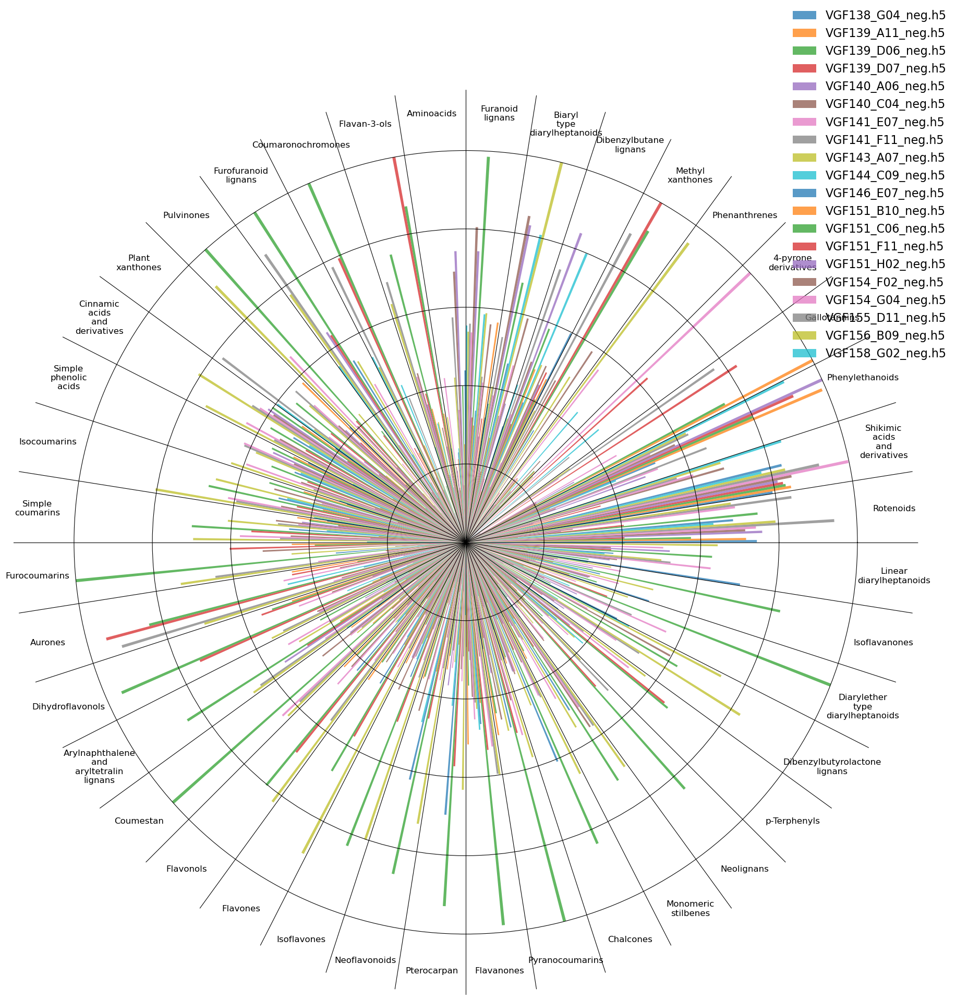

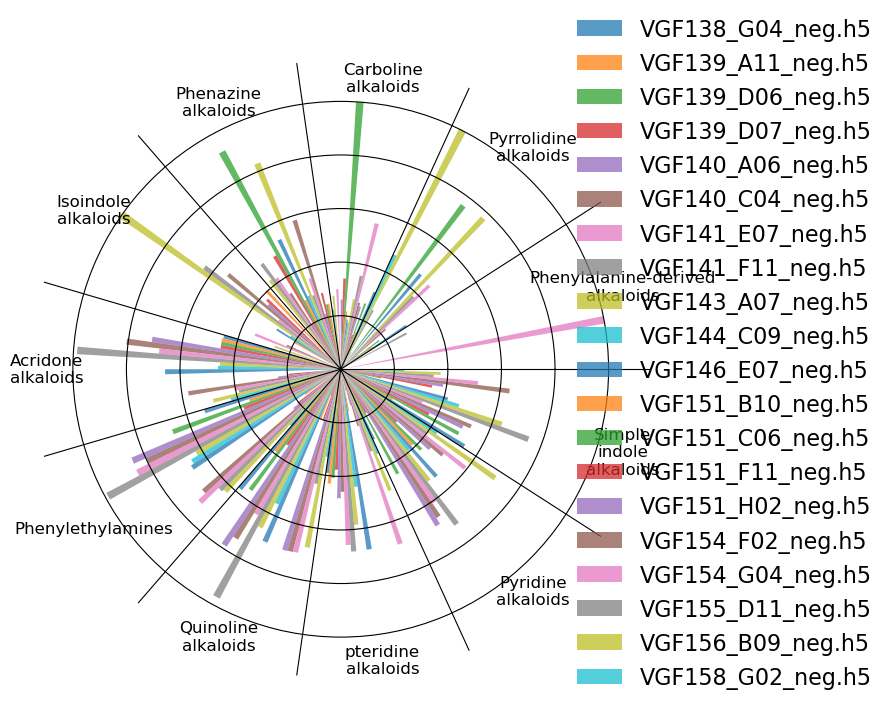

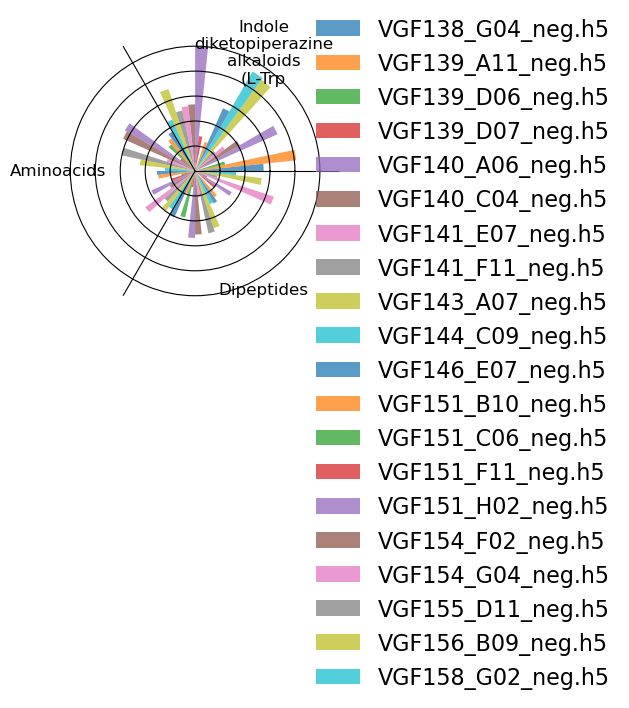

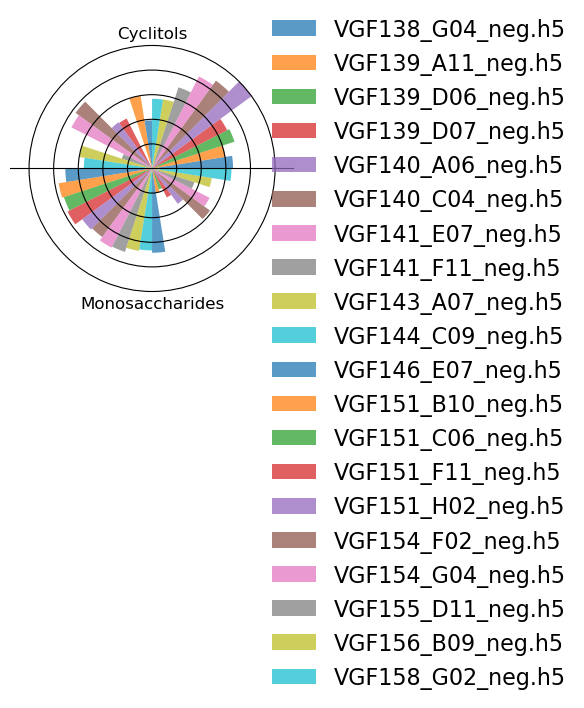

In [27]:
from matplotlib.offsetbox import OffsetImage, AnnotationBbox
from rdkit import Chem
from rdkit.Chem import Draw
from scipy.cluster.hierarchy import linkage, dendrogram
# Create the polar plot

def order_similar_rows(cluster_df):
    # Calculate the pairwise distances between rows
    # cols = [c for c in cluster_df.columns]# if ('deciduousforests' in c) | ('coniferousforests' in c)]
    distances = cluster_df.values

    # Perform hierarchical clustering
    Z = linkage(distances, method='average', metric='euclidean')

    # Get the order of the rows based on the clustering
    order = dendrogram(Z, no_plot=True)['leaves']

    # Reorder the rows of cluster_df
    cluster_df = cluster_df.iloc[order]

    # Show the reordered cluster_df
    return cluster_df#[cols]

def make_polar_structural_cluster_plot(cluster_df):
    cluster_df = order_similar_rows(cluster_df)
    s = cluster_df.shape[0]/20*7 + 5
    fig, ax = plt.subplots(nrows=1, ncols=1, figsize=(s, s), subplot_kw={'projection': 'polar'})

    # Define the angles for each side of the polygons
    angles = np.linspace(0, 2 * np.pi, cluster_df.shape[0] + 1)[:-1]
    shift_amount = np.diff(angles)[0] / cluster_df.shape[1]
    for iii in range(cluster_df.shape[1]):
        # Define the lengths of the bars
        bar_lengths = cluster_df.values[:, iii]
        # Plot the bars
        ax.bar(angles + iii * shift_amount, bar_lengths*1, width=shift_amount, align='edge', alpha=0.74, label=cluster_df.columns[iii].replace('Quant: ',''))

    # Set the labels for each side of the polygons
    ax.set_xticks(angles)
    ax.set_xticklabels(['' for i in range(cluster_df.shape[0])])

    # Set the title of the plot
    tick_labels = ax.xaxis.get_ticklabels()

    m = ax.get_ylim()[1]*1.1
    ax.set_ylim(0, m)



    counter = 0
    for i, row in cluster_df.iterrows():
        my_angle = angles[counter] + shift_amount* cluster_df.shape[1]/2
        # my_angle = angles[counter] + shift_amount*2
        # my_angle = my_angle * 180/np.pi - 90
        # my_angle = my_angle * 180/np.pi
        my_angle = 0
        # ax.text(angles[counter] + shift_amount*cluster_df.shape[1]/2, m * 1.11, '%s'%i, ha='center', va='center', fontsize=12, rotation=my_angle)#angles[counter]*180/4/np.pi)
        my_text = '%s'%i
        my_text = my_text.replace(' ','\n')
        ax.text(angles[counter] + shift_amount*cluster_df.shape[1]/2, m * 0.95, my_text, ha='center', va='center', fontsize=12, rotation=my_angle)#angles[counter]*180/4/np.pi)


        counter += 1

    ax.spines['polar'].set_visible(False)
    ax.grid(color='black')
    # Hide the y tick labels
    ax.set_yticklabels([])

    # Position the legend outside of the plot area
    ax.legend(bbox_to_anchor=(0.85, 1.1), loc='upper left',fontsize=16,frameon=False)

    plt.tight_layout()


unique_values = cluster_df.index.get_level_values('np_classifier_pathway').unique()
# unique_values = [u for u in unique_values is u!=None]
for uv in unique_values:
    selected_rows = cluster_df.loc[cluster_df.index.get_level_values('np_classifier_pathway') == uv]
    selected_rows.reset_index(drop=True, level="np_classifier_pathway", inplace=True)
    make_polar_structural_cluster_plot(selected_rows)
    # plt.savefig('../data/structural_clusters_%s.png'%uv)
    # plt.close()


In [47]:
unique_values

NameError: name 'unique_values' is not defined

In [ ]:
import matplotlib.pyplot as plt
import numpy as np

# Define the number of sides of the polygons
num_sides = bar_df.shape[0]

# Define the angles for each side of the polygons
angles = np.linspace(0, 2 * np.pi, num_sides + 1)[:-1]



# Create the polar plot
fig, ax = plt.subplots(nrows=2,ncols=2,figsize=(12,12),subplot_kw={'projection': 'polar'})
ax = ax.flatten()

for i in range(len(ax)):
    # Define the lengths of the bars
    bar_lengths = bar_df.values[:,i]
    # Plot the bars
    ax[i].bar(angles, bar_lengths, width=0.1, align='edge', color='blue', alpha=0.5)


    # Set the labels for each side of the polygons
    ax[i].set_xticks(angles)
    ax[i].set_xticklabels(['Side {}'.format(i+1) for i in range(num_sides)])

    # Set the title of the plot
    ax[i].set_title(bar_df.columns[i])

# Show the plot
plt.show()


In [ ]:
import matplotlib.pyplot as plt
import numpy as np

# Sample data
categories = ['Category 1', 'Category 2', 'Category 3', 'Category 4', 'Category 5']
values = [10, 15, 7, 12, 9]

# Convert values to radians
theta = np.linspace(0.0, 2 * np.pi, len(categories), endpoint=False)

# Create polar plot
fig, ax = plt.subplots(subplot_kw={'projection': 'polar'})
bars = ax.bar(theta, values)

# Set the color of each bar
for bar in bars:
    bar.set_facecolor(np.random.rand(3))

# Set the labels for each category
ax.set_xticks(theta)
ax.set_xticklabels(categories)

# Set the title of the plot
ax.set_title('Circular Barchart')

# Show the plot
plt.show()
